In [1]:
import pandas as pd
import requests
import configparser
import subprocess
import json
import requests
import configparser

from sentinelhub import SHConfig, BBox, bbox_to_dimensions, CRS, SentinelHubCatalog, DataCollection, SentinelHubRequest, MimeType

from utils import plot_image


/home/antonio/.pyenv/versions/3.8.5/envs/nitrates/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# https://dataspace.copernicus.eu/news/2023-9-28-accessing-sentinel-mission-data-new-copernicus-data-space-ecosystem-apis

# https://github.com/eu-cdse/notebook-samples/blob/c0e0ade601973c5d4e4bf66a13c0b76ebb099805/sentinelhub/migration_from_scihub_guide.ipynb

In [2]:

config_file = configparser.ConfigParser()
config_file.read("config.ini")

username = config_file["copernicus"]["username"]
password = config_file["copernicus"]["password"]


In [3]:

def get_access_token(username: str, password: str) -> str:
    # Prepare the data for the token request
    data = {
        "client_id": "cdse-public",
        "username": username,
        "password": password,
        "grant_type": "password",
    }
    
    # Send the request to get the access token
    try:
        r = requests.post(
            "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token",
            data=data,
        )
        r.raise_for_status()
        access_token = r.json().get("access_token")
        if not access_token:
            raise ValueError("No access token found in response.")
        return access_token
    except requests.exceptions.RequestException as e:
        print(f"Request failed: {e}")
        return None

# Retrieve the token
access_token = get_access_token(username, password)
if access_token:
    #print(f"Access token: {access_token}")
    print("Access token retrieved")
else:
    print("Failed to retrieve access token.")



Access token retrieved


In [31]:

config = SHConfig()

#https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Overview/Authentication.html
# Dashboard > User settings > OAuth clients > Create

config.sh_client_id = config_file["copernicus"]["client_id"] #"<CLIENT ID>"
config.sh_client_secret = config_file["copernicus"]["client_secret"] #<CLIENT SECRET>"
config.sh_token_url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
config.sh_base_url = "https://sh.dataspace.copernicus.eu"
config.save("cdse")
# Saved config can be later accessed with config = SHConfig("cdse")

config = SHConfig("cdse")
print("Config set")

aoi_coords_wgs84 = [-0.866977, 37.628916, -0.71696, 37.822802]
resolution = 10
aoi_bbox = BBox(bbox=aoi_coords_wgs84, crs=CRS.WGS84)
aoi_size = bbox_to_dimensions(aoi_bbox, resolution=resolution)

print(f'Image shape at {resolution} m resolution: {aoi_size} pixels')



Config set
Image shape at 10 m resolution: (1271, 2183) pixels


In [32]:
aoi_bbox

BBox(((-0.866977, 37.628916), (-0.71696, 37.822802)), crs=CRS('4326'))

In [30]:
catalog = SentinelHubCatalog(config=config)

aoi_bbox = BBox(bbox=aoi_coords_wgs84, crs=CRS.WGS84)
time_interval = '2024-01-01', '2024-01-31'

search_iterator = catalog.search(
    DataCollection.SENTINEL2_L2A,
    bbox=aoi_bbox,
    time=time_interval,
    fields={"include": ["id", "properties.datetime"], "exclude": []},

)

results = list(search_iterator)
print("Total number of results:", len(results))

results

Total number of results: 10


[{'id': 'S2A_MSIL2A_20240130T105301_N0510_R051_T30SXG_20240130T150453.SAFE',
  'properties': {'datetime': '2024-01-30T11:00:42.601Z'}},
 {'id': 'S2A_MSIL2A_20240130T105301_N0510_R051_T30SYG_20240130T150453.SAFE',
  'properties': {'datetime': '2024-01-30T11:00:39.153Z'}},
 {'id': 'S2B_MSIL2A_20240125T105239_N0510_R051_T30SXG_20240125T134527.SAFE',
  'properties': {'datetime': '2024-01-25T11:00:46.156Z'}},
 {'id': 'S2B_MSIL2A_20240125T105239_N0510_R051_T30SYG_20240125T134527.SAFE',
  'properties': {'datetime': '2024-01-25T11:00:42.706Z'}},
 {'id': 'S2A_MSIL2A_20240120T105341_N0510_R051_T30SXG_20240120T151150.SAFE',
  'properties': {'datetime': '2024-01-20T11:00:39.066Z'}},
 {'id': 'S2A_MSIL2A_20240120T105341_N0510_R051_T30SYG_20240120T151150.SAFE',
  'properties': {'datetime': '2024-01-20T11:00:35.627Z'}},
 {'id': 'S2A_MSIL2A_20240110T105421_N0510_R051_T30SXG_20240110T151449.SAFE',
  'properties': {'datetime': '2024-01-10T11:00:42.33Z'}},
 {'id': 'S2A_MSIL2A_20240110T105421_N0510_R051_T3

In [5]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=('2022-07-01', '2022-07-30'),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}}           )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=aoi_bbox,
    size=aoi_size,
    config=config,
)


In [6]:
true_color_imgs = request_true_color.get_data()

In [7]:
print(f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}.")
print(f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}")

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (2334, 1783, 3)


Image type: uint8


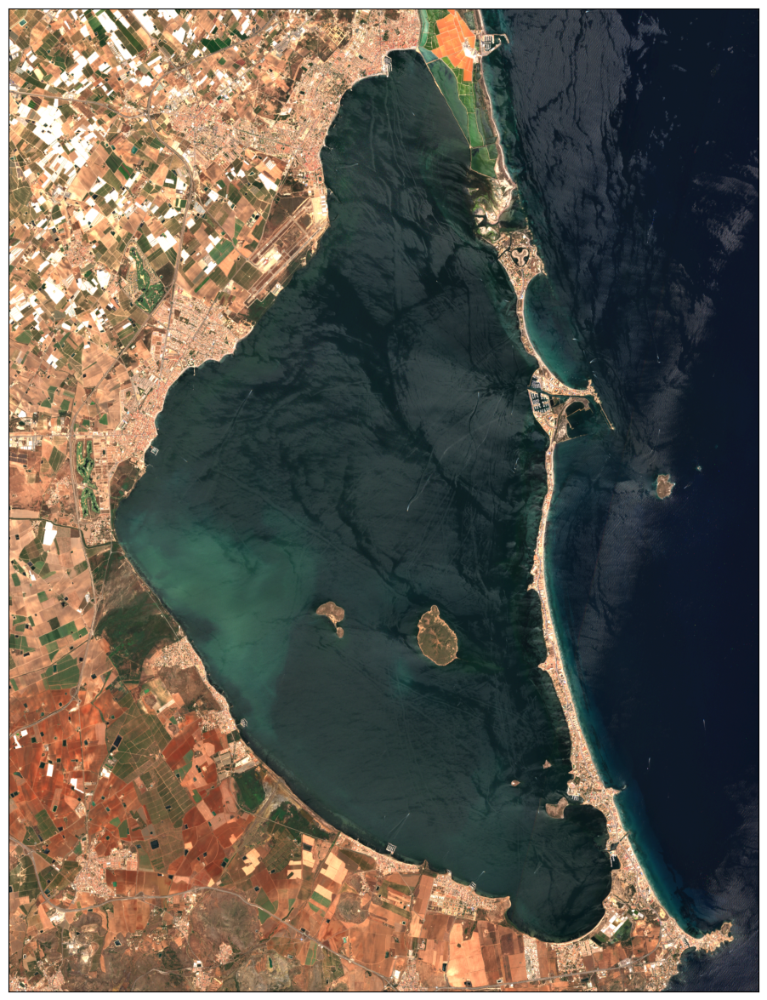

In [8]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

In [15]:
evalscript_ndvi = """
//VERSION=3
function setup() {
  return {
    input: [{
      bands: [
        "B04",
        "B08",
        "dataMask"
      ]
    }],
    output: {
      bands: 4
    }
  }
}
  
let viz = ColorGradientVisualizer.createWhiteGreen(-1.0, 1.0);

function evaluatePixel(samples) {
    let val = (samples.B08 - samples.B04) / (samples.B08 + samples.B04);
    val = viz.process(val);
    val.push(samples.dataMask);
    return val;
}
"""

request_ndvi_img = SentinelHubRequest(
    evalscript=evalscript_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=('2022-07-01', '2022-07-20'),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}}           )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=aoi_bbox,
    size=aoi_size,
    config=config,
)

In [16]:
ndvi_img = request_ndvi_img.get_data()

Image type: uint8


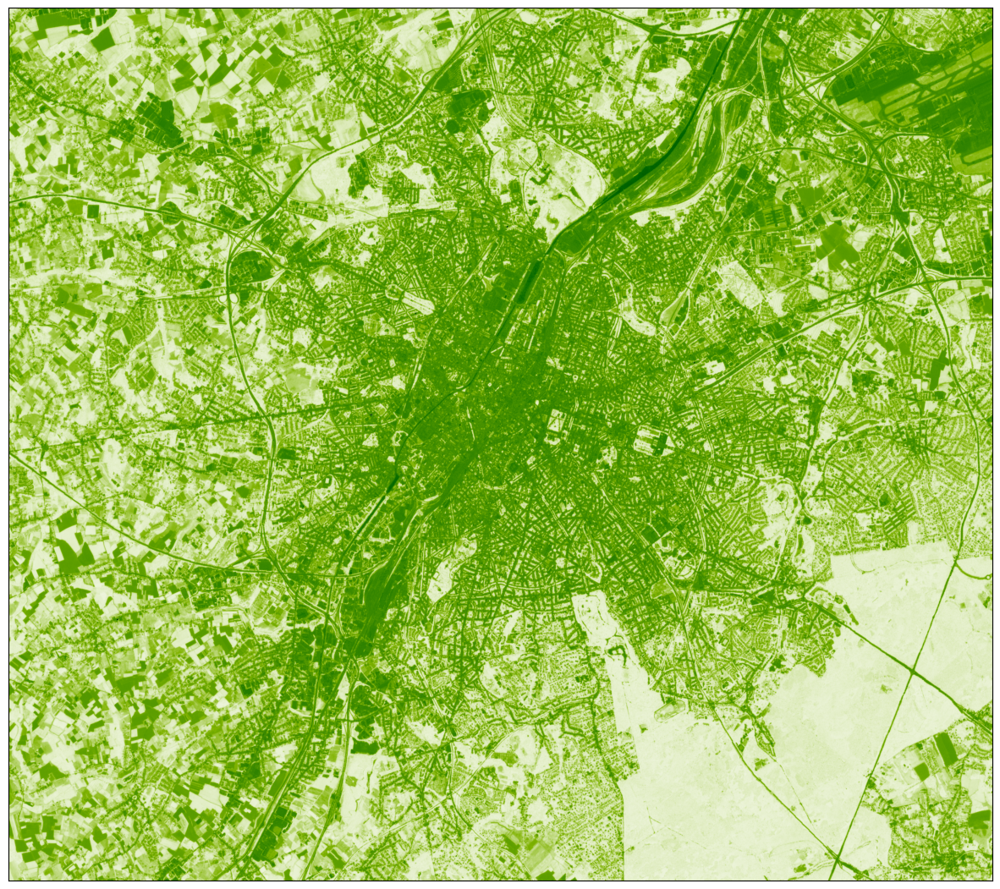

In [20]:
image = ndvi_img[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor= 1 / 255, clip_range=(-1, 1))

In [31]:
evalscript_ndvi = """
//VERSION=3
function setup() {
   return {
      input: ["B04", "B08", "dataMask"],
      output: { bands: 4 }
   };
}

const ramp = [
   [-0.5, 0x0c0c0c],
   [-0.2, 0xbfbfbf],
   [-0.1, 0xdbdbdb],
   [0, 0xeaeaea],
   [0.025, 0xfff9cc],
   [0.05, 0xede8b5],
   [0.075, 0xddd89b],
   [0.1, 0xccc682],
   [0.125, 0xbcb76b],
   [0.15, 0xafc160],
   [0.175, 0xa3cc59],
   [0.2, 0x91bf51],
   [0.25, 0x7fb247],
   [0.3, 0x70a33f],
   [0.35, 0x609635],
   [0.4, 0x4f892d],
   [0.45, 0x3f7c23],
   [0.5, 0x306d1c],
   [0.55, 0x216011],
   [0.6, 0x0f540a],
   [1, 0x004400],
];

const visualizer = new ColorRampVisualizer(ramp);

function evaluatePixel(samples) {
   let ndvi = index(samples.B08, samples.B04);
   let imgVals = visualizer.process(ndvi);
   return imgVals.concat(samples.dataMask)
}
"""

request_ndvi_img = SentinelHubRequest(
    evalscript=evalscript_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=('2022-07-01', '2022-07-10'),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}}           )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=aoi_bbox,
    size=aoi_size,
    config=config,
)

In [32]:
ndvi_img = request_ndvi_img.get_data()

Image type: uint8


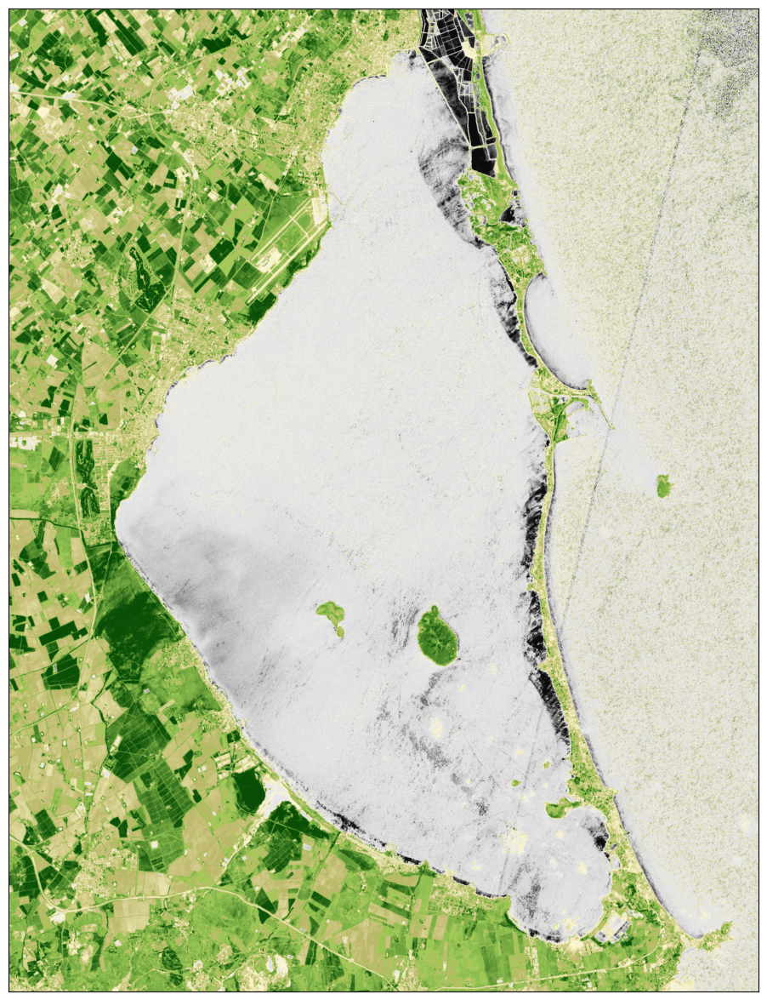

In [33]:
image = ndvi_img[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor= 1 / 255, clip_range=(-1, 1))

In [45]:
evalscript_ndwi = """
//VERSION 3
function setup() {
  return {
    input: ["B03", "B08", "dataMask"],
    output: { bands: 3 }
  }
}

const ramp = [
  [-0.8, 0x008000],
  [0, 0xFFFFFF],
  [0.8, 0x0000CC]
];

let viz = new ColorRampVisualizer(ramp);

function evaluatePixel(samples) {
  const val = index(samples.B03, samples.B08);
  let imgVals = viz.process(val);
  return imgVals.concat(samples.dataMask);
}
"""

request_ndwi_img = SentinelHubRequest(
    evalscript=evalscript_ndwi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=('2022-07-01', '2022-07-20'),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}}           )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=aoi_bbox,
    size=aoi_size,
    config=config,
)

In [20]:
evalscript_ndwi = """
//VERSION 3
function setup() {
    return {
        input: ["B03", "B08"],
        output: {
            bands: 1,
            sampleType: "FLOAT32"
        }
    }
}

function evaluatePixel(samples) {
    return [index(samples.B03, samples.B08)]
}
"""
request_ndwi_img = SentinelHubRequest(
    evalscript=evalscript_ndwi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=('2022-07-01', '2022-07-20'),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}}           )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=aoi_bbox,
    size=aoi_size,
    config=config,
)

TypeError: output_response() missing 1 required positional argument: 'response_format'

In [19]:
ndwi_img = request_ndwi_img.get_data()

DownloadFailedException: Failed to download from:
https://sh.dataspace.copernicus.eu/api/v1/process
with HTTPError:
400 Client Error: Bad Request for url: https://sh.dataspace.copernicus.eu/api/v1/process
Server response: "{"status": 400, "reason": "Bad Request", "message": "Format image/png does not support sample type FLOAT32.", "code": "RENDERER_EXCEPTION"}"

In [50]:
ndwi_img

[array([[[ 26, 141,  26],
         [ 41, 149,  41],
         [102, 179, 102],
         ...,
         [120, 120, 228],
         [132, 132, 230],
         [111, 111, 226]],
 
        [[ 51, 153,  51],
         [101, 178, 101],
         [123, 189, 123],
         ...,
         [137, 137, 231],
         [131, 131, 230],
         [117, 117, 227]],
 
        [[128, 192, 128],
         [127, 191, 127],
         [112, 184, 112],
         ...,
         [163, 163, 237],
         [126, 126, 229],
         [141, 141, 232]],
 
        ...,
 
        [[180, 218, 180],
         [184, 220, 184],
         [169, 212, 169],
         ...,
         [208, 208, 246],
         [228, 228, 250],
         [208, 208, 246]],
 
        [[147, 201, 147],
         [169, 212, 169],
         [167, 211, 167],
         ...,
         [226, 226, 249],
         [219, 219, 248],
         [196, 196, 243]],
 
        [[125, 190, 125],
         [132, 194, 132],
         [129, 192, 129],
         ...,
         [222, 222, 248],
  

Image type: uint8


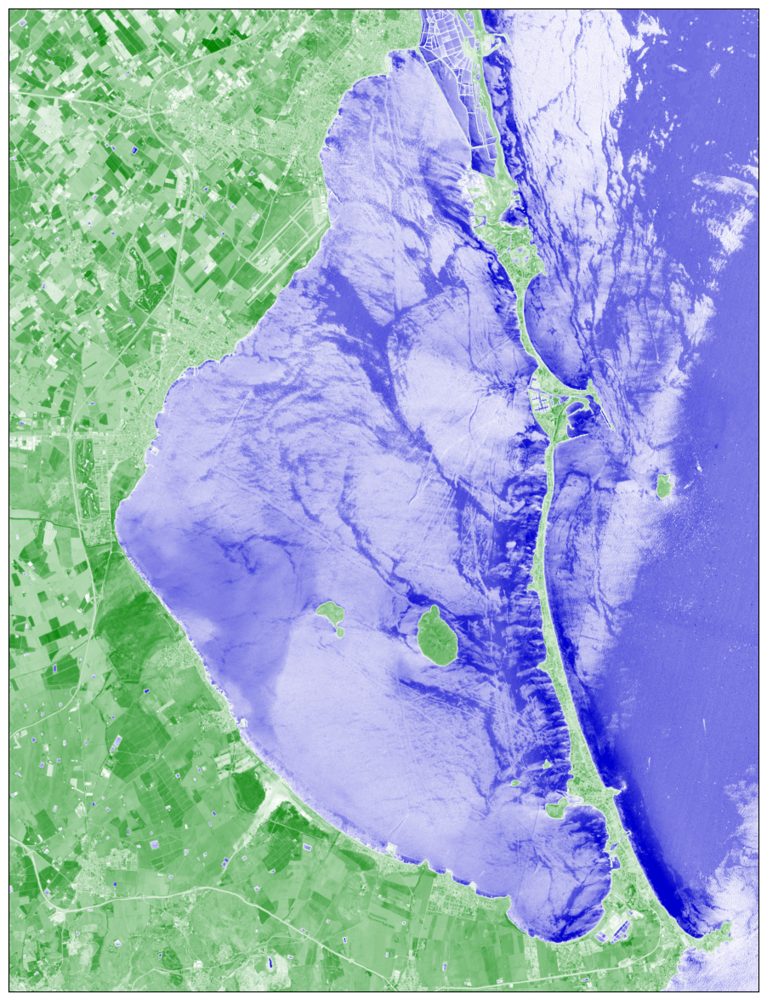

In [49]:
image = ndwi_img[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor= 1 / 255, clip_range=(-1, 1))

In [38]:
ndwi_img[0]

array([[[ 10,  78,   6, 255],
        [ 35,  98,  18, 255],
        [106, 158,  59, 255],
        ...,
        [238, 237, 228, 255],
        [229, 229, 229, 255],
        [233, 233, 233, 255]],

       [[ 36,  99,  20, 255],
        [102, 155,  57, 255],
        [121, 172,  68, 255],
        ...,
        [232, 232, 232, 255],
        [171, 171, 171, 255],
        [204, 204, 204, 255]],

       [[120, 171,  67, 255],
        [129, 179,  72, 255],
        [112, 163,  63, 255],
        ...,
        [219, 219, 219, 255],
        [145, 145, 145, 255],
        [164, 203,  90, 255]],

       ...,

       [[204, 198, 130, 255],
        [214, 208, 144, 255],
        [216, 210, 147, 255],
        ...,
        [222, 222, 222, 255],
        [224, 224, 224, 255],
        [222, 217, 157, 255]],

       [[152, 196,  84, 255],
        [190, 184, 109, 255],
        [185, 185, 105, 255],
        ...,
        [204, 204, 204, 255],
        [250, 244, 197, 255],
        [216, 211, 148, 255]],

       [[127

In [22]:
evalscript_mago = """
//VERSION=3
// User must set these three values
var indexNumber = 0; // Necessary to choose the visualization option
var minValue = 0;
var maxValue = 30;

// Color Scale
//var scaleLimits = [0, 5, 10, 20, 30]; // Define the borders
var scaleLimits = [minValue, (maxValue + 3 * minValue) / 4, (maxValue + minValue) / 2, (3 * maxValue + minValue) / 4, maxValue]
var s = 255; // Values range from 0 to 255 for every color channel
var colorScale =  // Define the RGB colors for each border
  [
    [0 / s, 0 / s, 255 / s], // Blue
    [0 / s, 255 / s, 255 / s], // Cyan
    [0 / s, 255 / s, 0 / s], // Green
    [255 / s, 255 / s, 0 / s], // Yellow
    [255 / s, 0 / s, 0 / s], // Red
  ];

// For evalscript V3 you need to specify two functions
//    setup() - where you specify inputs and outputs
//    evaluatePixel() - which calculates the output values for each pixel
function setup() {
  return {
    input: ["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "SCL", "dataMask"], // You need to add here all the bands you are going to use
    output: [
      { id: "default", bands: 3 },
      { id: "index", bands: 1, sampleType: "FLOAT32" },
      { id: "eobrowserStats", bands: 2, sampleType: 'FLOAT32' },
      { id: "dataMask", bands: 1 }
    ]
  };
}

function evaluatePixel(samples) {
  let NDWI = index(samples.B03, samples.B08); // Calculate the Normalized Difference Water Index, used in visualization
  let TrueColor = [samples.B04 * 2.5, samples.B03 * 2.5, samples.B02 * 2.5]; // Define true color composites multiplying each band by 2.5 to improve the appearance of images, used in visualization

  // Visualization
  // choose which one to use for visualization by setting indexNumber at the beginning of the code
  // indexNumber = 0 | Chlorophyll a mg / m3 (Mishra 2012 – Based on NDCI) 
  let index0 = 14.039 + (86.11 * (samples.B05 - samples.B04) / (samples.B05 + samples.B04)) + (194.325 * Math.pow((samples.B05 - samples.B04) / (samples.B05 + samples.B04), 2));
  let viz0 = colorBlend(index0, scaleLimits, colorScale);
  // indexNumber = 1 | Chlorophyll a for high values > 5 mg / m3 (Soria-Perpinyà 2021)
  let index1 = 19.866 * Math.pow(samples.B05 / samples.B04, 2.3051);
  let viz1 = colorBlend(index1, scaleLimits, colorScale);
  // indexNumber = 2 | Chlorophyll a  low values < 5 mg / m3 (Soria-Perpinyà 2021) 
  let index2 = Math.pow(10, -2.4792 * Math.log10(Math.max(samples.B03, samples.B02) / samples.B03) - 0.0389);
  let viz2 = colorBlend(index2, scaleLimits, colorScale);
  // indexNumber = 3 | Cyanobacteria (phycocyanin) cells/mL (Potes et al. 2018)
  let index3 = 115530.31 * Math.pow((samples.B03 * samples.B04) / samples.B02, 2.38);
  let viz3 = colorBlend(index3, scaleLimits, colorScale);
  // indexNumber = 4 | Cyanobacteria (Phycocyanin) mg/m3 (Soria-Perpinyà 2021)
  let index4 = 21.554 * Math.pow((samples.B05 / samples.B04), 3.47941);
  let viz4 = colorBlend(index4, scaleLimits, colorScale);
  // indexNumber = 5 | Turbidity NTU (Zhan et al. 2022)
  let index5 = 194.79 * (samples.B05 * (samples.B05 / samples.B02)) + 0.9061;
  let viz5 = colorBlend(index5, scaleLimits, colorScale);
  // indexNumber = 6 | CDOM ug/L (Soria-Perpinyà 2021)
  let index6 = 2.4072 * (samples.B04 / samples.B02) + 0.0709;
  let viz6 = colorBlend(index6, scaleLimits, colorScale);
  // indexNumber = 7 | Total Suspended Solids (TSS) mg/L (Soria-Perpinyà 2021)
  let index7 = 14.464 * (samples.B07 / samples.B02) + 16.336;
  let viz7 = colorBlend(index7, scaleLimits, colorScale);


  let imgVals = null;
  let val = NaN;
  // We made a first filter by NDWI (Water Index)
  if (NDWI < -0) { // If NDWI is lower than 0 is not water, so return  true color
    imgVals = [...TrueColor, samples.dataMask];
  } else { // Evaluate indexNumber
    switch (indexNumber) {
      case 0: // indexNumber = 0
        imgVals = [...viz0, samples.dataMask];
        val = index0;
        break;
      case 1: // indexNumber = 1
        imgVals = [...viz1, samples.dataMask];
        val = index1;
        break;
      case 2: // indexNumber = 2
        imgVals = [...viz2, samples.dataMask];
        val = index2;
        break;
      case 3: // indexNumber = 3
        imgVals = [...viz3, samples.dataMask];
        val = index3;
        break;
      case 4: // indexNumber = 4
        imgVals = [...viz4, samples.dataMask];
        val = index4;
        break;
      case 5: // indexNumber = 5
        imgVals = [...viz5, samples.dataMask];
        val = index5;
        break;
      case 6: // indexNumber = 6
        imgVals = [...viz6, samples.dataMask];
        val = index6;
        break;
      case 7: // indexNumber = 7
        imgVals = [...viz7, samples.dataMask];
        val = index7;
        break;
      default: // By default true color
        imgVals = [...TrueColor, samples.dataMask];
    }
  }

  // The library for tiffs works well only if there is only one channel returned. 
  // So we encode the "no data" as NaN here and ignore NaNs on frontend. 
  const indexVal = samples.dataMask === 1 ? val : NaN;

  return {
    default: imgVals,
    index: [indexVal],
    eobrowserStats: [val, isCloud(samples.SCL) ? 1 : 0],
    dataMask: [samples.dataMask]
  };
}

function isCloud(scl) {
  if (scl == 3) {
    // SC_CLOUD_SHADOWS
    return true;
  } else if (scl == 9) {
    // SC_CLOUD_HIGH_PROBABILITY
    return true;
  } else if (scl == 8) {
    // SC_CLOUD_MEDIUM_PROBABILITY
    return true;
  } else if (scl == 7) {
    // SC_UNCLASSIFIED
    return false;
  } else if (scl == 10) {
    // SC_THIN_CIRRUS
    return true;
  } else if (scl == 11) {
    // SC_SNOW_ICE
    return true;
  } else if (scl == 1) {
    // SC_SATURATED_OR_DEFECTIVE
    return true;
  } else if (scl == 2) {
    // SC_DARK_FEATURE_SHADOW
    return false;
  } else {
    return false;
  }
}
"""

request_mago_img = SentinelHubRequest(
    evalscript=evalscript_mago,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=('2022-07-01', '2022-07-20'),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}}           )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=aoi_bbox,
    size=aoi_size,
    config=config,
)

In [23]:
mago_img = request_mago_img.get_data()

image = mago_img[0]
print(f"Image type: {image.dtype}")


Image type: uint8


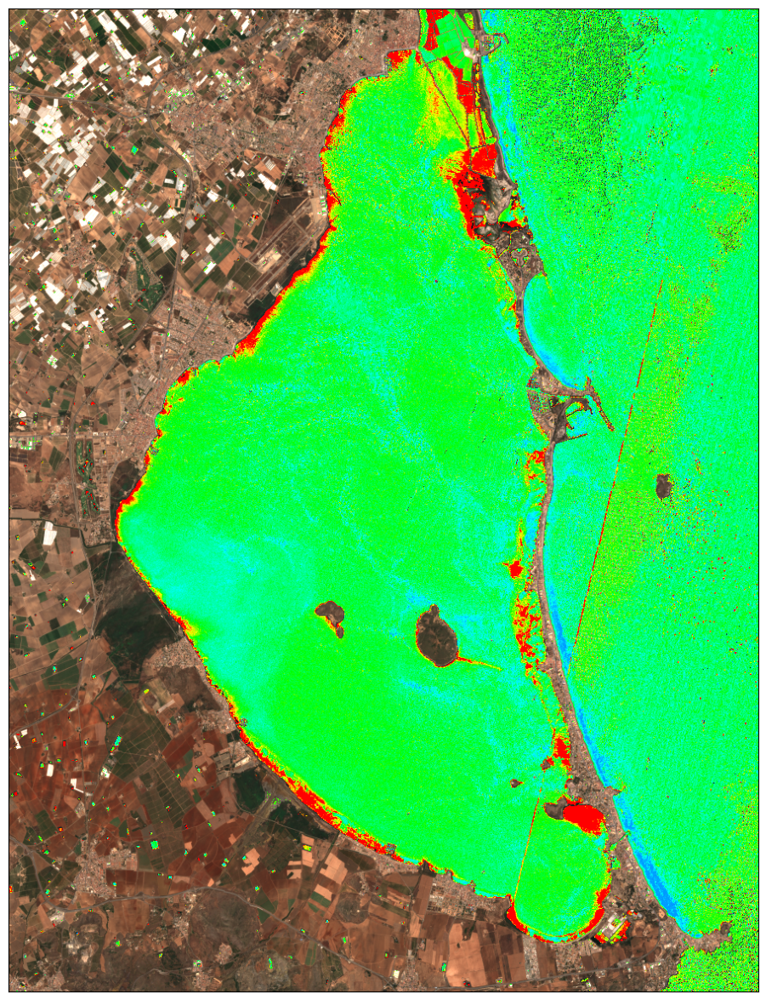

In [24]:

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor= 1 / 255, clip_range=(-1, 1))